## DS Project phase 1
### Professors: Bahrak & Yaghoob Zade
### Mohammad Mahdi Samadi 810101465
### Kasra Ghorbani 810101489

In [703]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly import subplots

import warnings
warnings.filterwarnings("ignore")

In [704]:
df = pd.read_csv("./preprocessed_data.csv")

#### Remove outliers
More than $ 99.9\% $ of the players are paid less than 25M$. From now on we'll focus on analyzing these players.

In [705]:
df_outlier = df.copy()
df = df[df["Salary"] < 50 * 10**6]

The top five leagues of football, often referred to as the "Big Five", are as follows:
1. La Liga (Spain)
2. English Premier League (England)
3. Serie A (Italy)
4. Bundesliga (Germany)
5. Ligue 1 (France)

Players of top 5 Europien leagues are separated from other players for further analysis.

In [706]:
df_top = df[df["Is_top_5_League"] == True].reset_index(drop=True)
df_not_top = df[df["Is_top_5_League"] == False].reset_index(drop=True)

There are two types of contracts in football.
1. Contract Renewal which is signed when a player's currnet contract is about to expire, and both the player and the club agree to continue.
2. New Contract which is signed when a player joins a club for the first time, or when they transfer from one club to another.

In [707]:
df_renew = df[df["Last Trans. Fee"] == 0].reset_index(drop=True)
df_new = df[df["Last Trans. Fee"] > 0].reset_index(drop=True)

# Correlation

First of all let's find possible correlations between the features.
1. Age based features:
- Clearly there is a relationship between *age* and *caps*.
- High corr between *Age* and *Age Signing Contract* is because they're about the same for each player.
- *caps* and *Age Signing Contract* are both caused by *Age* and that's why they have this high corr. Other than that there is no meaningful relationship between them.
- *under 30* was extracted from *Age*. That's why it's so correlated to these features.
- Most players don't get the chance to play for their national team. That's why *Games Played* and *Apps* are so correlated.

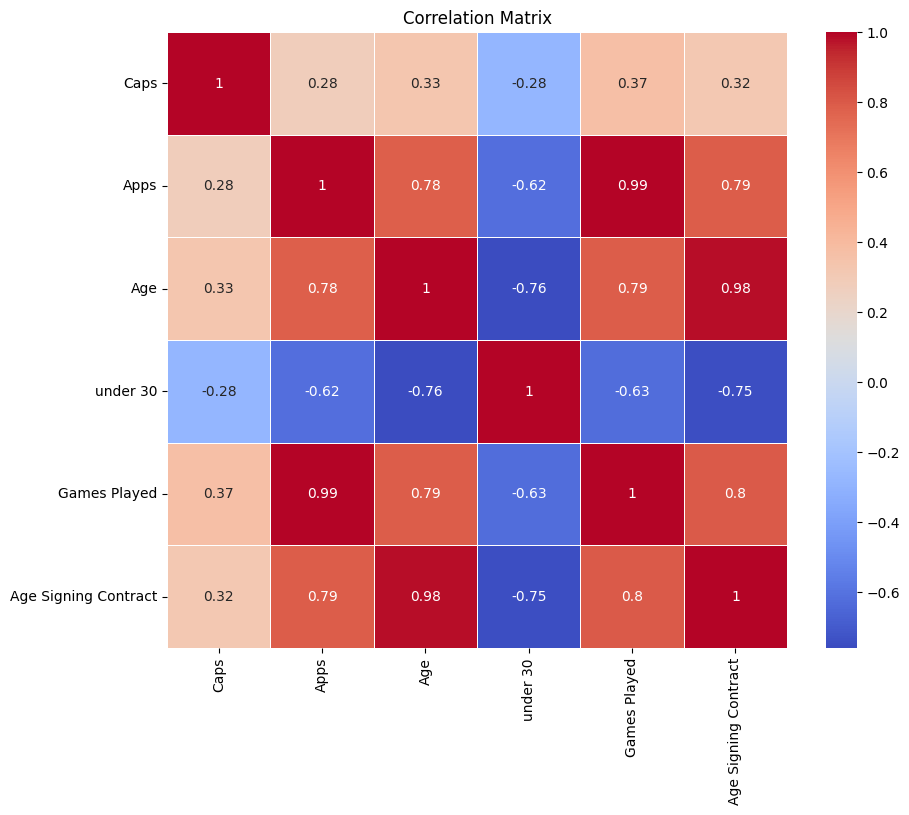

In [708]:
correlation_matrix = df[['Caps','Apps','Age','under 30',"Games Played",'Age Signing Contract']].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

2. Salary based features:
- based rich or top ranked nation players would probably end up in top ranked leagues
- Most of the top nation teams are european.

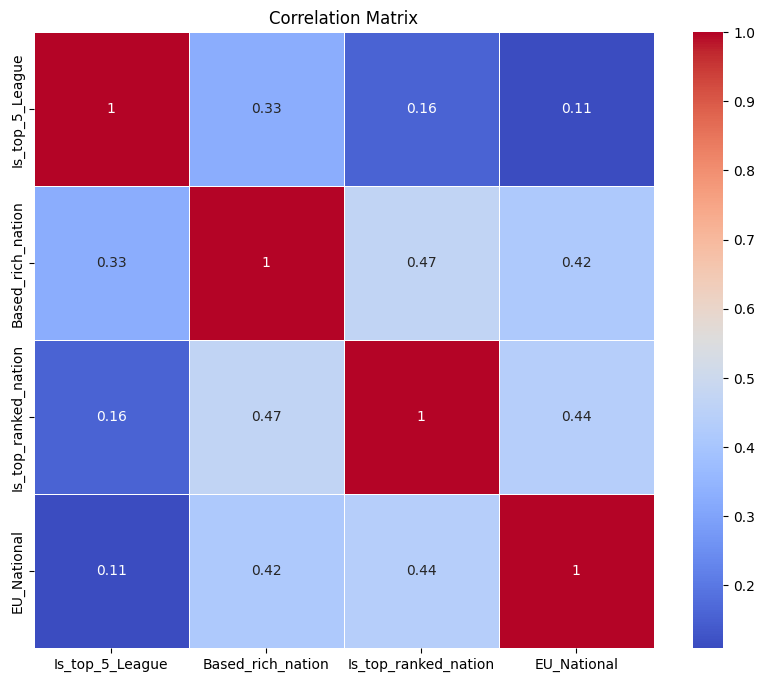

In [709]:
correlation_matrix = df[['Is_top_5_League', 'Based_rich_nation',
       'Is_top_ranked_nation', 'EU_National']].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

# Salary

### High earner players

In [710]:
target = "Salary"
df_most_paid = df_outlier[df_outlier[target] > 20 * 10**6]
df_most_paid["Division"].value_counts()

Division
Roshn Saudi League    15
LALIGA EA SPORTS       5
Premier League         5
Ligue 1 Uber Eats      1
Bundesliga             1
Name: count, dtype: int64

### Average Salaries paid each Year
Over the last two decades, more wealthy owners came into club managing. As a result of that salaries went higher and higher until 2021. There was a significant drop in salaries at 2022 and that's because of the COVID-19. It caused financial challenges for most of the football clubs because of reducing matchday revenue, sponsorship deals, and broadcast income. Actually among the big clubs, Only Real Madrid managed to maintain a positive income during this hard time. After facing some serious financial challenges, Most clubs decided to reduce salary of their players.

In [711]:
px.line(x=sorted(df["Begins Year"].unique()), y=df.groupby("Begins Year")[target].mean()).show()

### Contracts Cost Distribution for each Year

In [712]:
def separate_IQR_df(df, col):
    target = df[col].tolist()
    q1 = np.percentile(target, 25)
    q3 = np.percentile(target, 75)
    IQR = q3 - q1
    IQR_df = df[(df[col] > (q1 - 1.5*IQR)) & (df[col] < (q3))]
    return IQR_df

df_IQR_salary = separate_IQR_df(df=df, col="Salary")
px.violin(data_frame=df_IQR_salary, x="Begins Year", y="Salary")

### Distribution of Salaries
The plots shown below indicate that a large proportion of players earn few money and a few of them make a lot of it. It might be interesting to see who are the high-paid players. by referring to the names in the raw dataset, They're Cristiano Ronaldo, Karim Benzema, Neymar Jr and Kilian Mbappe. First three are currently playing in the Saudi Pro League and the other one' club is owned by a Qatari company.

In [713]:
fig = subplots.make_subplots(rows=1, cols=2, 
    subplot_titles=["Salaries less than one million", "Salaries between one and ten million"])
fig.add_trace(go.Histogram(x=df[df["Salary"] < 10**6]["Salary"],
                           xbins={"size":10**5}), row=1, col=1)
fig.add_trace(go.Histogram(x=df[df["Salary"].between(10**6, 10*10**6)]["Salary"],
                           xbins={"size":3*10**5}), row=1, col=2)
fig.show()

### Salaries Paid in top Leagues

In [714]:
avg_fee = df_top.groupby("Division")["Salary"].mean().reset_index()
avg_fee = avg_fee.sort_values('Salary', ascending=False)
fig = px.histogram(data_frame=avg_fee, x='Division', y='Salary', title="Avg Salaries Paid in top European Leagues")
fig.show()

Violin plots are a combination of box plots and density plots. Here is the salaries on new contracts signed in different years for 3 of the top european leagues. All of them show that salaries go higher and more outliers appear as the years go by.  

In [715]:
for top_league in ["Bundesliga", "Premier League", "LALIGA EA SPORTS"]:
    df_league = df_top[df_top["Division"] == top_league]
    px.violin(df_league, x="Begins Year", y="Salary", title=top_league).show()

### Top Players' Salary
Players with more quality and experience would probably get paid more than other players. Given these features, How could we measure the quality of players? We know that most of the great players who play in top european teams, Also play in top ranked nation teams. And among those players, the ones with more caps are obviously more experienced. Cristiano Ronaldo made all other players look really small, That's why we added the right plot not including outliers.

In [716]:
fig = subplots.make_subplots(rows=1, cols=2, subplot_titles=["Including Outliers", "Not Including outliers"])

fig.add_trace(px.histogram(df_outlier[(df_outlier["Is_top_ranked_nation"] == True) & (df_outlier["EU_National"] == True) & (df_outlier["Caps"] > 49)]
             , x='Caps', y='Salary', histfunc='avg', nbins=10, log_y=True).data[0],
             row=1, col=1)
fig.add_trace(px.histogram(df[(df["Is_top_ranked_nation"] == True) & (df["EU_National"] == True) & (df["Caps"] > 49)]
             , x='Caps', y='Salary', histfunc='avg', nbins=10).data[0],
             row=1, col=2)

fig.update_layout(title="Avg salary of top rated European countries players with 50 or more international caps")
fig.show()

### Impact of Age on Salary

In [717]:
def create_mean_median_std_lines(df, x_col, y_col):
    x = np.sort(df[x_col].unique())
    y = df.groupby(x_col)[y_col]
    line_mean = px.line(x=x, y=y.mean()).update_traces(line_color="cyan")
    line_median = px.line(x=x, y=y.median()).update_traces(line_color="blue")
    line_std = px.line(x=x, y=y.std()).update_traces(line_color="purple")
    return [line_mean.data[0], line_median.data[0], line_std.data[0]]

In [718]:
fig = subplots.make_subplots(rows=1, cols=3, 
    subplot_titles=[f"{target} distribution over different age ranges",
                    f"{target} of all players", f"Mean, Median & STD of {target}"])

df[(df["Salary"] < 1 * 10**6) & (df["Age Signing Contract"].between(15, 37))]

fig.add_trace(px.histogram(data_frame=df, x="Age Signing Contract", y=target).data[0], row=1, col=1)
fig.add_trace(px.scatter(data_frame=df, x="Age Signing Contract", y=target).data[0], row=1, col=2) 
fig.add_traces(create_mean_median_std_lines(df=df[(df["Salary"] < 1 * 10**6) & (df["Age Signing Contract"].between(15, 37))],
                                            x_col="Age Signing Contract", y_col=target), rows=1, cols=3)
fig.show()

- As the ages get closer to the range of 26 to 29, More high-paid players appear on the scatter plot. Also the most paid players are in the mentioned age range.
- A low value of the median compared to the mean indicates a right skewness of the salary distribution.
- The closer the ages get to range of 26 to 29, The more distributed the salaries are. The highest STDs appear in the mentioned age range.
- standard deviation line in the left plot is more smoothed. That's because the numbers are less distributed.

### Top Leagues Salary based on begining/expiring year
Here we plot average salary per signing/expiring year the contract and the players' age when signing them. 

In [719]:
top_leagues = list(df_top["Division"].unique())
cols = ["Age Signing Contract", "Begins Year", "Expires Year"]
fig = subplots.make_subplots(rows=len(top_leagues), cols=3, row_titles=top_leagues,
        column_titles=cols)

for i in range(len(top_leagues)):
    df_temp = df_top[df_top["Division"] == top_leagues[i]]
    for j in range(len(cols)):
        x = np.sort(df_temp[cols[j]].unique())
        y = df_temp.groupby(cols[j])["Salary"].mean()
        fig.add_trace(px.line(x=x, y=y).data[0], row=i+1, col=j+1)

fig.update_layout(width=1300, height=1200)
fig.update_layout(title='Average Salaries paid in Big Five Europien leagues')
fig.show()

Each column compares the leagues in its own way.
#### Age Signing Contract
It increases as the age goes higher. But after a while, Clubs don't pay as much to their players. There are two main reasons for that:
- After a certain age players begin to lose their strength and skills.
- They're closer to retirement and clubs would not gain any money from selling them.
#### Begins Year
Reason for the drop in 2022 is explained earlier. Seems that Serie A teams managed the challenges well and powerfully came back the very next year while the Bundesliga teams continued to decrease the salaries.
#### Expires Year
Seems that all 5 leagues are focused on long-term contracs with young players with a bright future in front of them and that's great.

As expected the proportion of *top 5*, *top ranked nation* and *based rich nation* players out of all players increases as the salary goes higher. 

# Age

### Relationship between duration of contracts and age of the players
The duration of contracts are higher for younger players in all leagues. But top 5 leagues teams sign more long-term contracts than other teams. Most of the other leagues are financially instable and can't to it. For example Persian Gulf Pro League. 

In [720]:
fig = subplots.make_subplots(rows=1, cols=2, subplot_titles=["Top 5 Europien Leagues", "Other leagues"])

df_temp = df_top[df_top["Age Signing Contract"] > 17]
top_line = px.line(x=np.sort(df_temp["Age Signing Contract"].unique()),
              y=df_temp.groupby("Age Signing Contract")["Contract Duration"].mean())
fig.add_trace(top_line.data[0], row=1, col=1)

df_temp = df_not_top[df_not_top["Age Signing Contract"] > 17]
not_top_line = px.line(x=np.sort(df_temp["Age Signing Contract"].unique()),
              y=df_temp.groupby("Age Signing Contract")["Contract Duration"].mean())
fig.add_trace(not_top_line.data[0], row=1, col=2)

fig.update_layout(title="Contract Duration per Age when Signing the Contract")
fig.show()
del df_temp

# Transfers

### Number of Transfers in Top Clubs
For each transfer, We are only provided with name of the club that sold the player. Therefore we can't analyse buyer clubs and this would be just about the clubs that sell their players.

In [721]:
target = "Last Trans. Fee"

In [722]:
top_teams = ['Real Madrid', 'Barcelona', 'Man City', 'Liverpool', 'Chelsea', 'Arsenal',
             'Bayern München', 'Dortmund', 'Juventus', 'Napoli', 'Paris Saint-Germain']

df_top_prev_teams = df.copy()
df_top_prev_teams["Is last club top"] = df_top_prev_teams["Last Club"].apply(lambda x: True if x in top_teams else False)
df_top_prev_teams = df_top_prev_teams[df_top_prev_teams["Is last club top"] == True].reset_index()
df_top_prev_teams["Contract"] = df_top_prev_teams["Last Trans. Fee"].apply(lambda x: "Sold" if x > 0 else "Extended")
df_top_prev_teams["bruh"] = df_top_prev_teams["Last Club"].apply(lambda x: 1)

bar = px.bar(data_frame=df_top_prev_teams, x="Last Club", y="bruh", color="Contract", barmode="stack",
             title="Number of Contracts Signed in Top Clubs")
bar.update_xaxes(tickvals=top_teams)
bar.show()
del df_top_prev_teams

- Some clubs sell a lot of players each season. Here is a list of possible reasons. Financial reasons, Squad rebuilding (Chelsea), Developing and selling talent (Dortmund), Maintaining squad balance and Financial Fair Play (Man City).
- Some clubs have a lot of extended contracts. That's because they're happy with their squad (Real Madrid) or because they don't have enough money to buy new expensive players and rather kepp going with existing ones (Juventus).
- Some clubs don't sell/buy much players. They probably sign long-term contracts with young talented players and give them enough time to shine (Arsenal). 

### Impact of Age on Transfer Market Value
- Players with age of 20 to 24 are more valuable than other players in transfer market.
- A low value of the median compared to the mean indicates a right skewness of the salary distribution.
- The closer the ages get to range of 20 to 24, The more distributed the transfer values are. The highest STDs appear in the mentioned age range.
- standard deviation line in the left plot is more smoothed. That's because the numbers are less distributed.

In [723]:
fig = subplots.make_subplots(rows=1, cols=3, 
    subplot_titles=[f"{target} distribution over different age ranges",
                    f"{target} of all players", f"Mean, Median & STD of {target}"])

fig.add_trace(px.histogram(data_frame=df_new, x="Age Signing Contract", y=target).data[0], row=1, col=1)
fig.add_trace(px.scatter(data_frame=df_new, x="Age Signing Contract", y=target).data[0], row=1, col=2) 
fig.add_traces(create_mean_median_std_lines(df=df_new, x_col="Age Signing Contract", y_col=target), rows=1, cols=3)
fig.show()

### Market Values Distribution over Years

In [724]:
def separate_IQR_df(df, col):
    target = df[col].tolist()
    q1 = np.percentile(target, 25)
    q3 = np.percentile(target, 75)
    IQR = q3 - q1
    IQR_df = df[(df[col] > (q1 - 1.5*IQR)) & (df[col] < (q3))]
    return IQR_df

df_IQR_LTF = separate_IQR_df(df=df_new, col="Last Trans. Fee")
px.violin(data_frame=df_IQR_LTF, x="Begins Year", y="Last Trans. Fee")

### Most Expensive Transfers

Here are the most expensive transfers in past few years. Monaco (Mbappe), Benfica (Joao Felix and Enzo Fernandez), Dortmund (Erling Halland and Jude Bellingham) and Ajax made a lot of money from selling their young talented players.

In [725]:
n=27
sorted_last_fee = df_new[['Last Club', 'Last Trans. Fee']].sort_values('Last Trans. Fee', ascending=False)
px.scatter(data_frame=sorted_last_fee.head(n=n), x='Last Club', y='Last Trans. Fee', title="Most Expensive Transfers").show()

### Expensive Transfers from a Top Club
Here are all the transfers higher than 15 million dollars from one of the top teams.
- Benfica makes great money from selling a few of its players.
- some clubs like Ajax, Man City and Chelsea also make a lot of money but they've sold more players with less prices than Benfica.
- There are some big clubs not selling much players and probably make money from other ways (sponsers or their owners), such as Man Utd, Arsenal and PSG.

In [726]:
top_teams = df_new[df_new["Is_top_prev_club"] == True]["Last Club"].unique()
df_top_prev_teams = df_new[df_new["Last Trans. Fee"] > 15 * 10**6]
df_top_prev_teams["Is last club top"] = df_new["Last Club"].apply(lambda x: True if x in top_teams else False)
df_top_prev_teams = df_top_prev_teams[df_top_prev_teams["Is last club top"] == True].reset_index()

sorted_last_fee = df_top_prev_teams.sort_values('Last Trans. Fee', ascending=False)
px.scatter(data_frame=sorted_last_fee, x='Last Club', y='Last Trans. Fee', title="Most Expensive Transfers from Top Clubs").show()

### Most CLubs Income only from Selling Players
We saw the exact price of the most priced transfers in a scatter plot. Here is a simpler representation of the same information.

In [727]:
n=10
fig = subplots.make_subplots(rows=2, cols=2, row_titles=["Top CLubs", "other Clubs"],
                             column_titles=["Average Income", "Total Income"])

df_prev_top = df_new[df_new["Is_top_prev_club"] == True]
df_prev_not_top = df_new[df_new["Is_top_prev_club"] == False]

avg_fee = df_prev_top.groupby("Last Club")["Last Trans. Fee"].mean().reset_index()
avg_fee = avg_fee.sort_values('Last Trans. Fee', ascending=False)
fig.add_trace(px.line(data_frame=avg_fee.head(n=n), x='Last Club', y='Last Trans. Fee').data[0], row=1, col=1)

avg_fee = df_prev_top.groupby("Last Club")["Last Trans. Fee"].sum().reset_index()
avg_fee = avg_fee.sort_values('Last Trans. Fee', ascending=False)
fig.add_trace(px.line(data_frame=avg_fee.head(n=n), x='Last Club', y='Last Trans. Fee').data[0], row=1, col=2)

avg_fee = df_prev_not_top.groupby("Last Club")["Last Trans. Fee"].mean().reset_index()
avg_fee = avg_fee.sort_values('Last Trans. Fee', ascending=False)
fig.add_trace(px.line(data_frame=avg_fee.head(n=n), x='Last Club', y='Last Trans. Fee').data[0], row=2, col=1)

avg_fee = df_prev_not_top.groupby("Last Club")["Last Trans. Fee"].sum().reset_index()
avg_fee = avg_fee.sort_values('Last Trans. Fee', ascending=False)
fig.add_trace(px.line(data_frame=avg_fee.head(n=n), x='Last Club', y='Last Trans. Fee').data[0], row=2, col=2)

fig.update_layout(width=1300, height=800)
fig.show()

- Many believe that Manchester City's success in recent years is because of its high spending. However, this club has also made a lot of money from selling players. For example Raheem Sterling 56m€, Ferran Torres 55m€ and Gabriel Jesus 53m€. Great management if you ask me.
- Some clubs, not from the top clubs, make great deal of money from selling their players. Such as Monaco, Leicester City, RB Leipzig, Brighton, Lille, etc.
- Athletic Bilbau had only one sell on the list (Kepa Arizabalaga -> Chelsea) and that was a huge sell. That's why it's up there in the "mean" plot.

### The age when top clubs sell their players
Seems that some big clubs give up on their players really soon. But thant's not true. For example Real Madrid and Man City transfer players in their earliest 20's. That's because of the number of great players and stars in tehse kind of teams and the few minutes young players get to play. Most of the times they rather loan these young players to other teams and let them gain more experience and comeback in a few years. Brahim Diaz is a great example.

In [728]:
df_prev_top = df[df["Is_top_prev_club"] == True]
avg_fee = df_prev_top.groupby("Last Club")["Age"].mean().reset_index()
avg_fee = avg_fee.sort_values('Age')
fig = px.line(data_frame=avg_fee, x='Last Club', y='Age')
fig.show()

This table shows the average *Salary* and *Last Fee* for 4 classes based on two bool variables.

In [729]:
pd.pivot_table(data=df, values=["Salary", "Last Trans. Fee"],
               index=["Is_top_5_League", "under 30"],
               aggfunc={"Salary": "mean", "Last Trans. Fee": "mean"})

Last Trans. Fee        Salary
Is_top_5_League under 30                               
False           False        1.345592e+05  2.510148e+05
                True         2.187285e+05  1.468548e+05
True            False        5.746955e+06  3.133254e+06
                True         3.930618e+06  1.047613e+06

# Apps and Caps

our dataset includes a large number of less experienced players who have only played in low-rated clubs. In order to have a better understanding of the relationship between apps and caps we'll separate the players who have reached a min numof games played.

In [730]:
px.scatter(data_frame=df[(df["Apps"] > 150) & (df["Caps"] > 30)], x="Apps", y="Caps").show()

There seems to be a positive correlation between two features.

In [731]:
fig = px.scatter_3d(data_frame=df, x="Apps", y="Age", z="Caps")
fig.show()

- older players have played more games.
- max numof *Caps* increases as the *Age*/*Apps* goes higher.
- There seems to be a upper bound for numof games played by players of different ages. This bound is like a line. Let's see what's the line.

In [732]:
def train_linear_regression_model(X, Y):
    n = len(X)
    x_mu = sum(X) / n
    y_mu = sum(Y) / n
    
    x2_mu = sum([X[i] * X[i] for i in range(n)])
    xy_mu = sum([X[i] * Y[i] for i in range(n)])
    
    estimated_alpha = (x_mu * y_mu - xy_mu) / (x_mu * x_mu - x2_mu)
    estimated_beta = y_mu - estimated_alpha * x_mu
    
    return [estimated_alpha, estimated_beta]

In [733]:
df_sorted = df.sort_values(by=['Age', 'Apps'], ascending=False)
df_sorted = df_sorted.groupby('Age', group_keys=True).head(n=3).reset_index(drop=False)

x = np.sort(df_sorted["Age"].unique())
y = df_sorted.groupby("Age")["Apps"].mean()

a, b = train_linear_regression_model(x.tolist(), y.tolist())
fig = px.scatter(x=x, y=y, title="Max Number of Games Played by Players of each Age")
fig.add_trace(px.line(x=df["Age"], y = a * df["Age"] + b).update_traces(line_color="green", line_width=5).data[0], row=1, col=1)
fig.show()

# Nationality

### Local Players in top Leagues
Laliga uses native players the most.

In [734]:
leage_to_nation = {"Ligue 1 Uber Eats": "FRA", "LALIGA EA SPORTS": "ESP",
                   "Premier League": "ENG", "Bundesliga": "GER", "Serie A TIM": "ITA",}
y = []
for league in list(leage_to_nation.keys()):
    df_temp = df[df["Division"] == league]
    df_temp["Home Country"] = df_temp["Nat"].apply(lambda x: True if x == leage_to_nation[league] else False)
    y.append(df_temp["Home Country"].sum() / len(df_temp))
    del df_temp
px.histogram(x=list(leage_to_nation.keys()), y=y, title="Proportion of local players in top European leagues").show()

### Top Players's Salary

As expected, More rich and ranked nation players recieve more money.

In [735]:
y_axis = ["Is_top_5_League", "Is_top_ranked_nation", "Based_rich_nation"]
thresholds = [7 * 10**6, 6*10**6, 5*10**6]
fig = subplots.make_subplots(rows=1, cols=len(y_axis), 
    subplot_titles=["Top 5 Euoropean leagues players", "Top Ranked Nation Players", "Rich Nation Players"],)

for i in range(len(y_axis)):
    df_temp = df[df['Salary'] < thresholds[i]].reset_index()
    df_temp['bin'] = pd.cut(df_temp['Salary'], bins=20)
    df_temp['y'] = df_temp.groupby('bin')[y_axis[i]].transform('mean') * 100
    hist = px.histogram(df_temp, x='Salary', y='y', histfunc='avg', nbins=20)
    fig.add_trace(hist.data[0], row=1, col=i+1)
    del df_temp
fig.show()
